# Exercise 11

# 11.1

In this part of the excercise we want to study how the Neural Network behaves for different values of:
- the number of training data, $N_{train}$;
- the number of epochs, $N_{epochs}$;
- the noise on each training data $\sigma$.

We will fit the function:
$$f(x)=2x+1$$

In [1]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import math
import string
import scipy.optimize 
from itertools import product 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects

In [2]:

# target parameters of f(x) = m*x + b
m = 2 # slope
b = 1 # intersect
#different parameters to use
N_train=[10,250,5000]
sigma = [0.0,0.2,0.4]
N_epochs=[10,50]


In [3]:
# generate training inputs

methods=[]
models=[]
history=[]
Combinations = product(N_train,sigma,N_epochs)
np.random.seed(0)
x_valid = np.random.uniform(-1, 1, 50)
x_valid.sort()
y_target = m * x_valid + b # ideal (target) linear function
y_valid=[]



for index, i in enumerate(Combinations):
    print(i)

    models.append(tf.keras.Sequential())
    models[index].add(Dense(1, input_shape=(1,)))
    models[index].compile(optimizer='sgd', loss='mse', metrics=['mse'])
    x_train=np.random.uniform(-1, 1, i[0])
    y_train=np.random.normal(m * x_train+ b, i[1])
    y_valid.append(np.random.normal(m * x_valid + b, i[1]))
    history.append(models[index].fit(
        x=x_train, 
        y=y_train, 
        batch_size=32, 
        epochs=i[2],
        shuffle=True, # a good idea is to shuffle input before at each epoch
        validation_data=(x_valid,y_valid[index])))


(10, 0.0, 10)
Epoch 1/10


2022-06-13 11:16:09.213501: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1/1 [==============================] - 0s 478ms/step - loss: 1.9971 - mse: 1.9971 - val_loss: 3.2545 - val_mse: 3.2545
Epoch 2/10
1/1 [==============================] - 0s 19ms/step - loss: 1.9722 - mse: 1.9722 - val_loss: 3.2104 - val_mse: 3.2104
Epoch 3/10
1/1 [==============================] - 0s 20ms/step - loss: 1.9477 - mse: 1.9477 - val_loss: 3.1670 - val_mse: 3.1670
Epoch 4/10
1/1 [==============================] - 0s 20ms/step - loss: 1.9236 - mse: 1.9236 - val_loss: 3.1245 - val_mse: 3.1245
Epoch 5/10
1/1 [==============================] - 0s 22ms/step - loss: 1.8999 - mse: 1.8999 - val_loss: 3.0827 - val_mse: 3.0827
Epoch 6/10
1/1 [==============================] - 0s 21ms/step - loss: 1.8767 - mse: 1.8767 - val_loss: 3.0416 - val_mse: 3.0416
Epoch 7/10
1/1 [==============================] - 0s 20ms/step - loss: 1.8538 - mse: 1.8538 - val_loss: 3.0012 - val_mse: 3.0012
Epoch 8/10
1/1 [==============================] - 0s 24ms/step - loss: 1.8313 - mse: 1.8313 - val_loss: 2.9

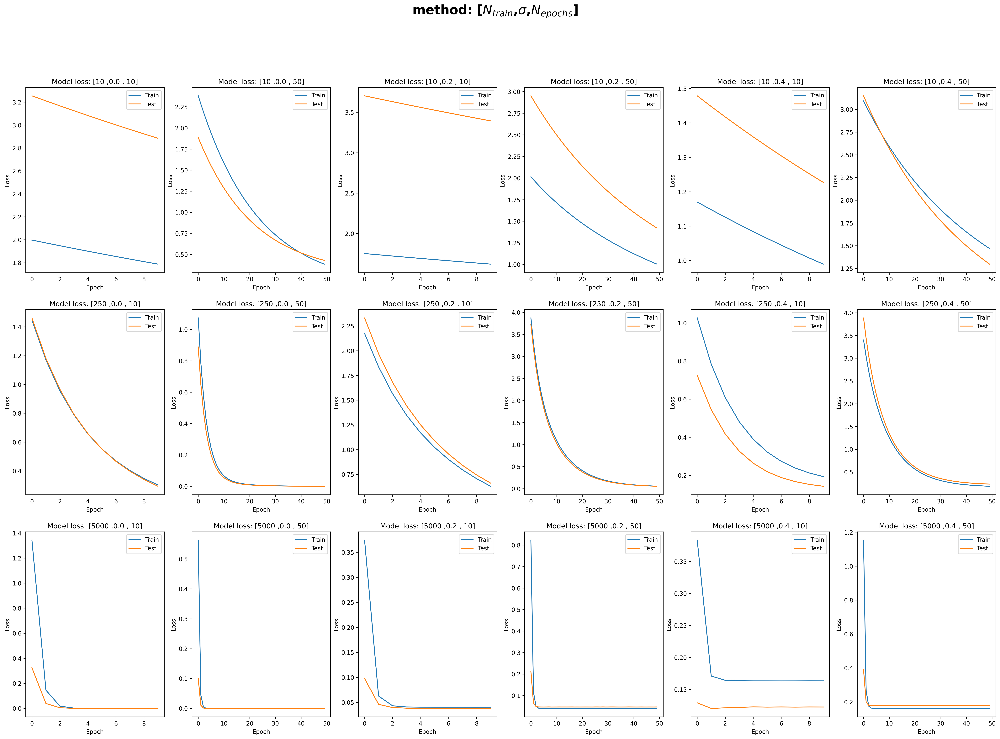

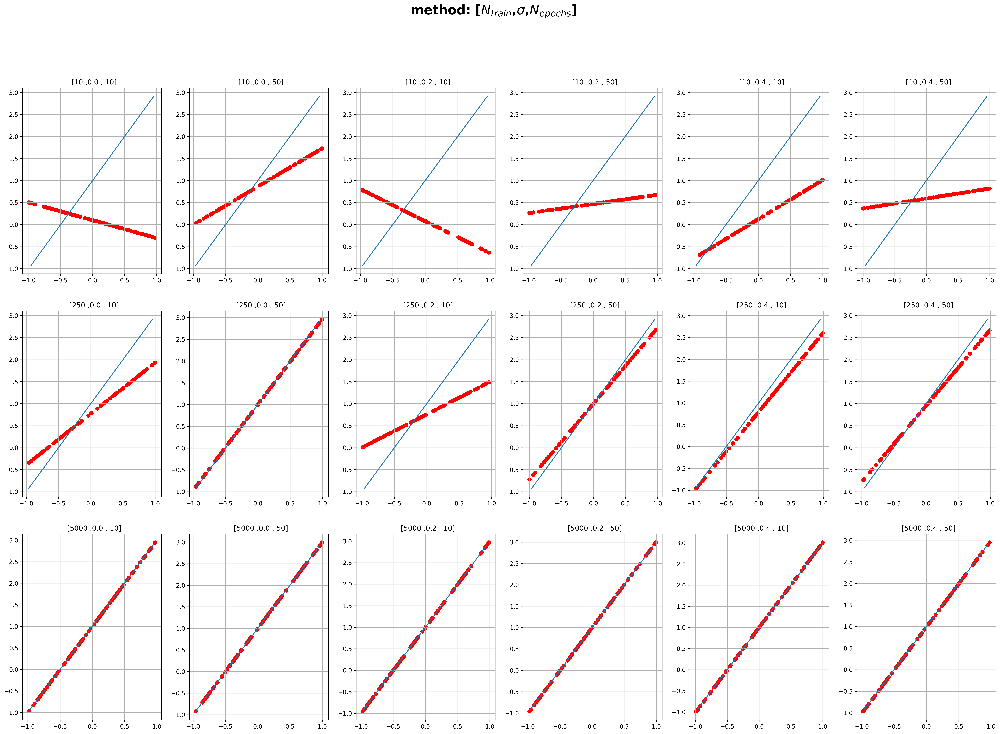

(10, 0.0, 10)  : test loss: 2.884269952774048   , test accuracy: 2.884269952774048
(10, 0.0, 50)  : test loss: 0.42945754528045654   , test accuracy: 0.42945754528045654
(10, 0.2, 10)  : test loss: 3.475604295730591   , test accuracy: 3.475604295730591
(10, 0.2, 50)  : test loss: 1.3946419954299927   , test accuracy: 1.3946419954299927
(10, 0.4, 10)  : test loss: 1.2835294008255005   , test accuracy: 1.2835294008255005
(10, 0.4, 50)  : test loss: 1.2238448858261108   , test accuracy: 1.2238448858261108
(250, 0.0, 10)  : test loss: 0.29323258996009827   , test accuracy: 0.29323258996009827
(250, 0.0, 50)  : test loss: 0.0003037515270989388   , test accuracy: 0.0003037515270989388
(250, 0.2, 10)  : test loss: 0.5707492232322693   , test accuracy: 0.5707492232322693
(250, 0.2, 50)  : test loss: 0.022815607488155365   , test accuracy: 0.022815607488155365
(250, 0.4, 10)  : test loss: 0.0576024167239666   , test accuracy: 0.0576024167239666
(250, 0.4, 50)  : test loss: 0.026268091052770615 

In [4]:
Combinations = product(N_train,sigma,N_epochs)
score=[]




fig=plt.figure(figsize=(30,20),dpi=300)
plt.suptitle("method: [$N_{train}$,$\sigma$,$N_{epochs}$]",weight="bold",size=22)
for index,i in enumerate(Combinations):
    score.append(models[index].evaluate(x_valid, y_target, batch_size=32, verbose=0))
    plt.subplot(3,6,index+1)
    plt.plot(history[index].history['loss'])
    plt.plot(history[index].history['val_loss'])
    plt.title("Model loss: ["+str(i[0])+" ,"+str(i[1])+" , "+str(i[2])+"]")
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='best')
plt.show()
Combinations = product(N_train,sigma,N_epochs)
fig=plt.figure(figsize=(30,20),dpi=300)
plt.suptitle("method: [$N_{train}$,$\sigma$,$N_{epochs}$]",weight="bold",size=22)
for index,i in enumerate(Combinations):   
    plt.subplot(3,6,index+1)
    plt.title("  ["+str(i[0])+" ,"+str(i[1])+" , "+str(i[2])+"]")
    x_predicted = np.random.uniform(-1, 1, 100)
    y_predicted = models[index].predict(x_predicted,verbose=0)
    plt.scatter(x_predicted, y_predicted,color='r')
    plt.plot(x_valid, y_target)
    plt.grid(True)
plt.show()
Combinations = product(N_train,sigma,N_epochs)

for index,i in enumerate(Combinations):   
    print(i," : test loss:",score[index][0],"  , test accuracy:",score[index][1])
   
       
    

From the previous plots we notice that:
- in general a training set of 10 elements, is not enough to have a good fit;
- for $N_{train}=250$ and $N_{epochs}=10$, it is clear that the model doesn't produce good results, but when the number of epochs is increased to $50$ and $\sigma=0$, the results are better and the model loss quickly converges to $0$. When the noise is increased to $\sigma\geq0.2$, the model accuracy decreases.

- for $N_{train}=5000$ we have good results for all $N_{epochs}$ and $\sigma$ used.


# 11.2

In this exercise we want to fit the following polynomial:
$$f(x)=4-3x-2x^2+3x^3$$
for $x\in[-1,1]$.
To produce a better fit, we want to study how the model behaves for different choices of:
- the number of layers;
-  the number of neurons in each layer;
- the activation function;
-  the optimizer;
- the loss function.

Using the previous results, we set $N_{train}=5000$, $N_{epochs}=50$ with a noise of $\sigma=0.1$.

In [5]:
#f(x) = 3x**3-2x**2-3x+4
def f(x):
    values=[4,-3,-2,+3]
    return values[0]+values[1]*x+values[2]*(x**2)+values[3]*(x**3)
N_train=5000
sigma = 0.1
N_epochs=50

N_layer=[1,4,10]#input+hidden
N_neurons=[1,10,100]
Activation=["linear","tanh","elu","relu"]
loss=["mse","mae"]
optimizer=["sgd","adagrad","adam"]


# Variation of $N_{layers}$ and $N_{neurons}$ keeping all other variables fixed.


In [6]:
methods=[]
models=[]
history=[]
Combinations = product(N_layer,N_neurons)

np.random.seed(0)
x_valid = np.random.uniform(-1, 1, 500)
x_valid.sort()

y_target = f(x_valid) # ideal (target) linear function
y_valid=np.random.normal(f(x_valid), sigma)

x_train=np.random.uniform(-1, 1, N_train)
y_train=np.random.normal(f(x_train), sigma)

#generate models
for  index , i in enumerate(Combinations):
    models.append(tf.keras.Sequential())
    
    for j in range(i[0]):
        if (j==0):
            models[index].add(Dense(i[1], input_shape=(1,),activation="tanh"))
        else:
            models[index].add(Dense(i[1],activation="tanh"))
   
    models[index].add(Dense(1))
    models[index].compile(optimizer='sgd', loss='mse', metrics=['mse'])
    models[index].summary()
    history.append(models[index].fit(
        x=x_train, 
        y=y_train, 
        batch_size=32, 
        epochs=N_epochs,
        shuffle=True, # a good idea is to shuffle input before at each epoch
        validation_data=(x_valid,y_valid)))

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_18 (Dense)            (None, 1)                 2         
                                                                 
 dense_19 (Dense)            (None, 1)                 2         
                                                                 
Total params: 4
Trainable params: 4
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
157/157 [==============================] - 0s 1ms/step - loss: 1.9239 - mse: 1.9239 - val_loss: 0.9463 - val_mse: 0.9463
Epoch 2/50
157/157 [==============================] - 0s 948us/step - loss: 0.6714 - mse: 0.6714 - val_loss: 0.3869 - val_mse: 0.3869
Epoch 3/50
157/157 [==============================] - 0s 972us/step - loss: 0.3750 - mse: 0.3750 - val_loss: 0.3456 - val_mse: 0.3456
Epoch 4/50
157/157 [==============================] - 0

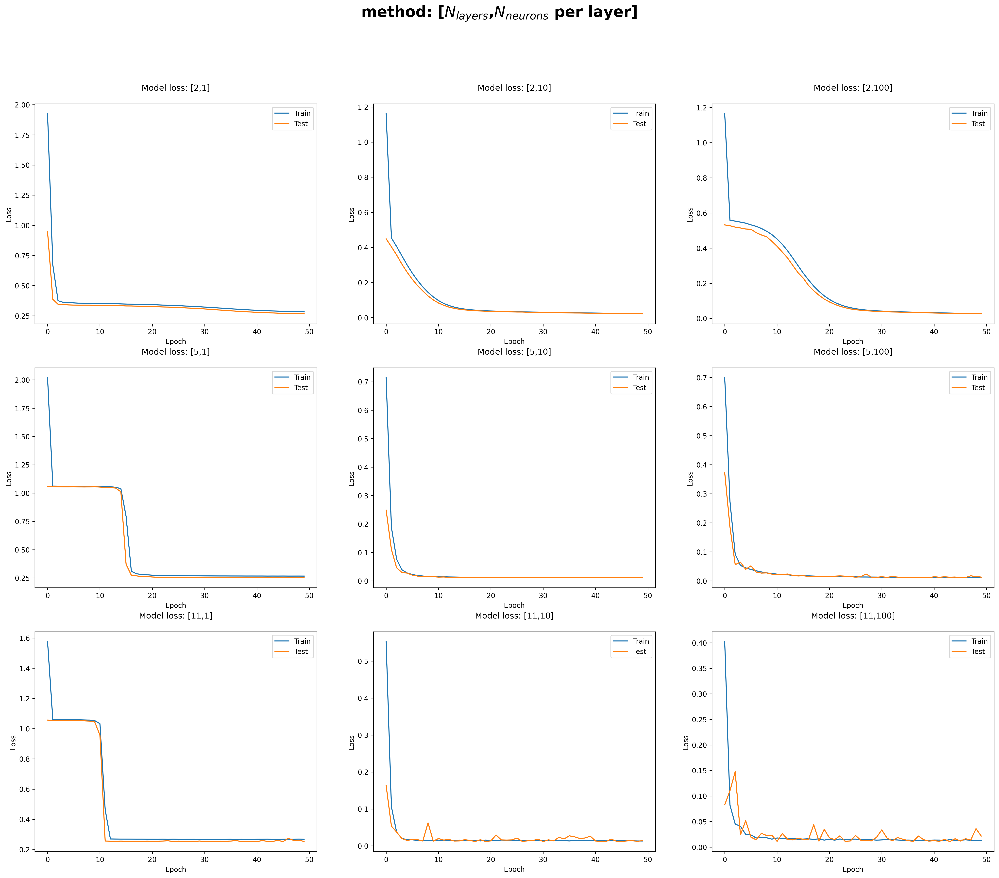

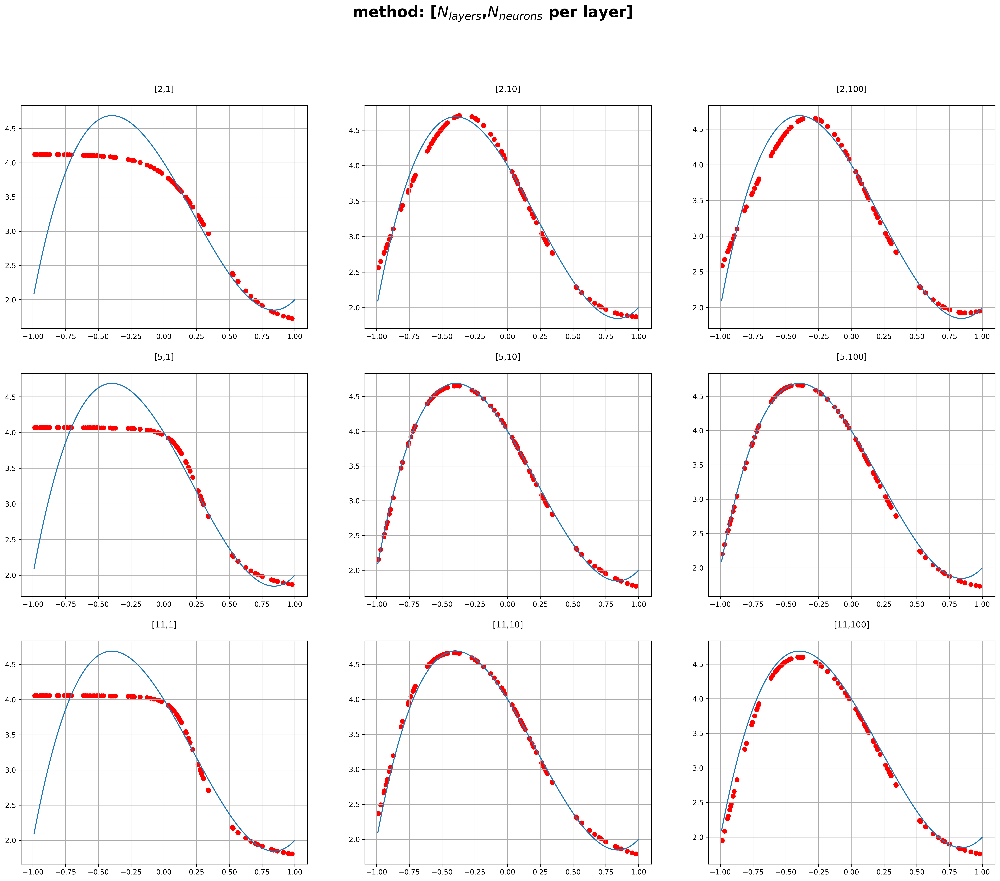

method : [ 2 , 1 ] : test loss: 0.26252713799476624
method : [ 2 , 10 ] : test loss: 0.0125660952180624
method : [ 2 , 100 ] : test loss: 0.017773039638996124
method : [ 5 , 1 ] : test loss: 0.24756911396980286
method : [ 5 , 10 ] : test loss: 0.0022416904103010893
method : [ 5 , 100 ] : test loss: 0.00435742549598217
method : [ 11 , 1 ] : test loss: 0.2497541755437851
method : [ 11 , 10 ] : test loss: 0.004739553667604923
method : [ 11 , 100 ] : test loss: 0.01374531164765358


In [7]:
Combinations = product(N_layer,N_neurons)
score=[]
x_predicted = np.random.uniform(-1, 1, 100)
fig=plt.figure(figsize=(25,20),dpi=300)
plt.suptitle("method: [$N_{layers}$,$N_{neurons}$ per layer]",weight="bold",size=22)
for index,i in enumerate(Combinations):
    score.append(models[index].evaluate(x_valid, y_target, batch_size=32, verbose=0))
    
    plt.subplot(3,3,index+1)
    plt.plot(history[index].history['loss'])
    plt.plot(history[index].history['val_loss'])
    plt.title('Model loss: '+"["+str(i[0]+1)+","+str(i[1])+"]\n")
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='best')
plt.show()
Combinations = product(N_layer,N_neurons)
fig=plt.figure(figsize=(25,20),dpi=300)
plt.suptitle("method: [$N_{layers}$,$N_{neurons}$ per layer]",weight="bold",size=22)
for index,i in enumerate(Combinations):
    plt.subplot(3,3,index+1)
 
    y_predicted = models[index].predict(x_predicted,verbose=0)
    plt.scatter(x_predicted, y_predicted,color='r')
    plt.title("["+str(i[0]+1)+","+str(i[1])+"]\n")
    plt.plot(x_valid, y_target)
    plt.grid(True)
plt.show()
Combinations = product(N_layer,N_neurons)
for index,i in enumerate(Combinations):   
    print("method : [",str(i[0]+1),",",i[1],"] : test loss:",score[index][0])
   

From the plots above, we observe that, usually, having $1$ or $100$ neurons per layer or having 2 or 11 layers produces bad predictions. This means that we are, respectively, underfitting and overfitting the model.
We obtain that the model with the lowest test loss  is [5,10].

# Variation of the Activation functions, fixed on 5 layers with 10 neurons each.

In [8]:
Activation=["linear","tanh","elu","relu"]
Combinations = product(Activation,Activation)
models=[]
history=[]
#generate models
for  index , i in enumerate(Combinations):
    models.append(tf.keras.Sequential())
    models[index].add(Dense(10, input_shape=(1,),activation=i[0]))
    models[index].add(Dense(10,activation=i[0]))
    models[index].add(Dense(10,activation=i[1]))
    models[index].add(Dense(10,activation=i[1]))
    models[index].add(Dense(1))
    models[index].compile(optimizer='sgd', loss='mse', metrics=['mse'])
    models[index].summary()
    history.append(models[index].fit(
        x=x_train, 
        y=y_train, 
        batch_size=32, 
        epochs=N_epochs,
        shuffle=True, # a good idea is to shuffle input before at each epoch
        validation_data=(x_valid,y_valid)))


Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_72 (Dense)            (None, 10)                20        
                                                                 
 dense_73 (Dense)            (None, 10)                110       
                                                                 
 dense_74 (Dense)            (None, 10)                110       
                                                                 
 dense_75 (Dense)            (None, 10)                110       
                                                                 
 dense_76 (Dense)            (None, 1)                 11        
                                                                 
Total params: 361
Trainable params: 361
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
157/157 [==============================] - 1

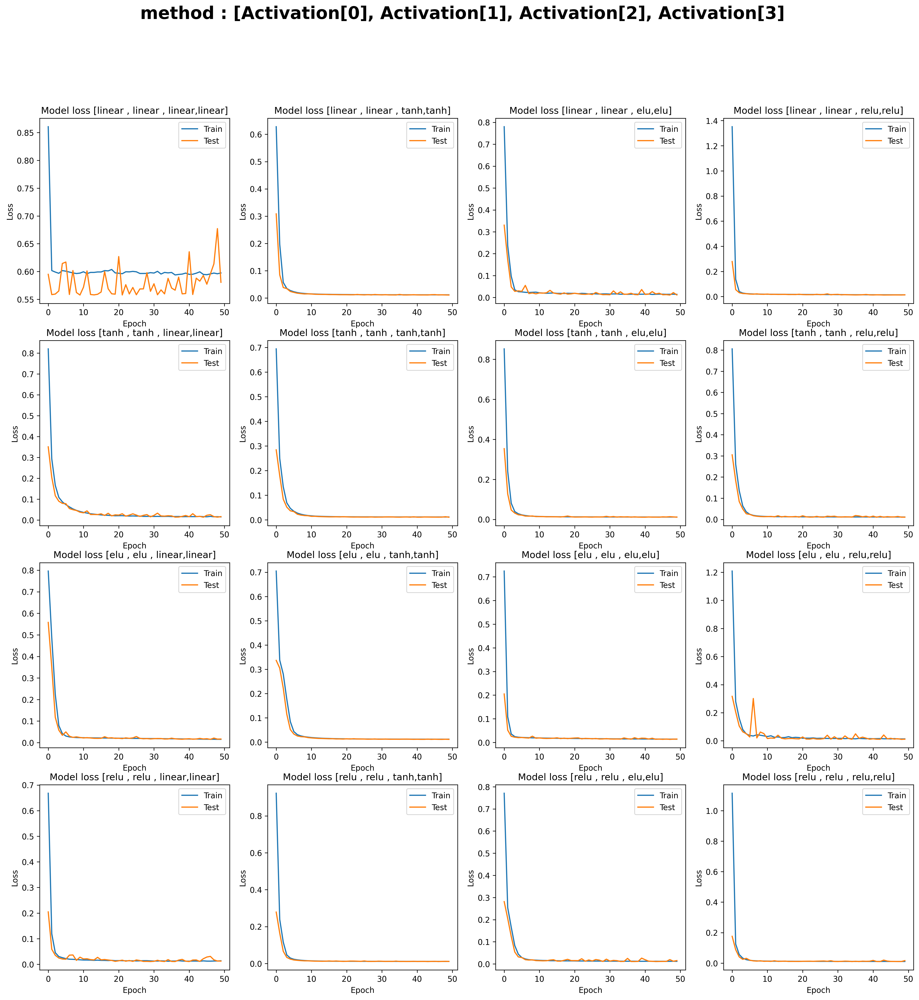

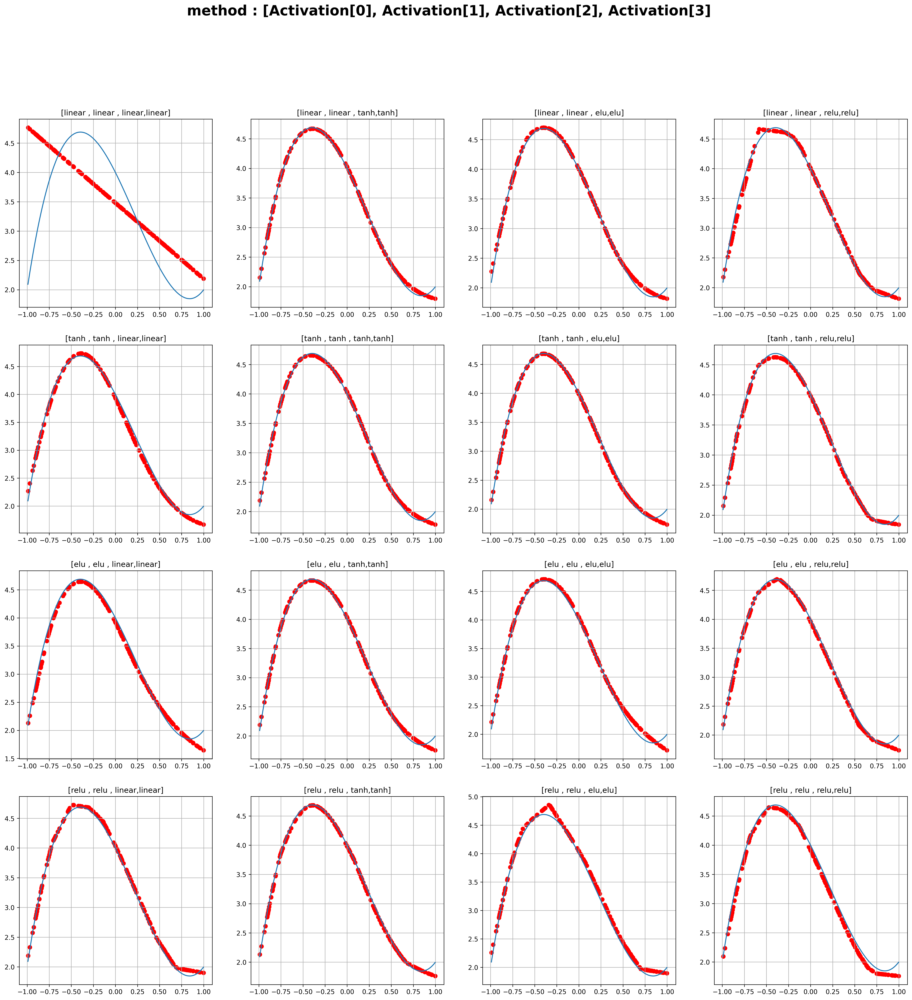

method : [ linear  ,  linear  ,  linear , linear ] : test loss: 0.5766831040382385
method : [ linear  ,  linear  ,  tanh , tanh ] : test loss: 0.0015025385655462742
method : [ linear  ,  linear  ,  elu , elu ] : test loss: 0.0022583657409995794
method : [ linear  ,  linear  ,  relu , relu ] : test loss: 0.0046179466880857944
method : [ tanh  ,  tanh  ,  linear , linear ] : test loss: 0.007432711310684681
method : [ tanh  ,  tanh  ,  tanh , tanh ] : test loss: 0.0018682745285332203
method : [ tanh  ,  tanh  ,  elu , elu ] : test loss: 0.002448705490678549
method : [ tanh  ,  tanh  ,  relu , relu ] : test loss: 0.0018182301428169012
method : [ elu  ,  elu  ,  linear , linear ] : test loss: 0.008712200447916985
method : [ elu  ,  elu  ,  tanh , tanh ] : test loss: 0.0022111632861196995
method : [ elu  ,  elu  ,  elu , elu ] : test loss: 0.004427341278642416
method : [ elu  ,  elu  ,  relu , relu ] : test loss: 0.003271006280556321
method : [ relu  ,  relu  ,  linear , linear ] : test loss

In [9]:
Combinations = product(Activation,Activation)
score=[]
x_predicted = np.random.uniform(-1, 1, 200)
fig=plt.figure(figsize=(20,20),dpi=300)
plt.suptitle("method : [Activation[0], Activation[1], Activation[2], Activation[3]",weight="bold",size=22)
for index,i in enumerate(Combinations):
    
    plt.subplot(4,4,index+1)
       
    plt.plot(history[index].history['loss'])
    plt.plot(history[index].history['val_loss'])
    plt.title("Model loss ["+str(i[0])+" , "+str(i[0])+" , "+str(i[1])+","+str(i[1])+"]")
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='best')
plt.show() 
Combinations = product(Activation,Activation)

fig=plt.figure(figsize=(25,25),dpi=300)
plt.suptitle("method : [Activation[0], Activation[1], Activation[2], Activation[3]",weight="bold",size=22)
for index,i in enumerate(Combinations):  
    score.append(models[index].evaluate(x_valid, y_target, batch_size=32, verbose=0))
    
    plt.subplot(4,4,index+1)
    plt.title("["+str(i[0])+" , "+str(i[0])+" , "+str(i[1])+","+str(i[1])+"]")
    y_predicted = models[index].predict(x_predicted,verbose=0)
    plt.scatter(x_predicted, y_predicted,color='r')
    plt.plot(x_valid, y_target)
    plt.grid(True)
plt.show()
Combinations = product(Activation,Activation)
for index,i in enumerate(Combinations):   
    print("method : [",str(i[0])," , ",str(i[0])," , ",str(i[1]),",",str(i[1]),"] : test loss:",score[index][0])
     

In the previous plots, more combinations of the activation functions give good results but no combination seems to be able to correctly predict the behaviour of $f(x)$ for $x\approx 1$. This could be caused by the fact that there is a minimum of $f(x)$ too close to our training bounds.  
In the next section we use the combination: $[$linear  ,  linear  ,  tanh , tanh$]$, which has the lowest test loss.

# Variations of loss function and optimizer

In [10]:
loss=["mse","mae","msle","log_cosh"]
optimizer=["sgd","adagrad","adam","adamax"]
Combinations = product(loss,optimizer)
models=[]
history=[]
#generate models
for  index , i in enumerate(Combinations):
    models.append(tf.keras.Sequential())
    models[index].add(Dense(10, input_shape=(1,),activation="linear"))
    models[index].add(Dense(10,activation="linear"))
    models[index].add(Dense(10,activation="tanh"))
    models[index].add(Dense(10,activation="tanh"))
    models[index].add(Dense(1))
    models[index].compile(optimizer=i[1], loss=i[0], metrics=['mse'])
    models[index].summary()
    history.append(models[index].fit(
        x=x_train, 
        y=y_train, 
        batch_size=32, 
        epochs=N_epochs,
        shuffle=True, # a good idea is to shuffle input before at each epoch
        validation_data=(x_valid,y_valid)))

Model: "sequential_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_152 (Dense)           (None, 10)                20        
                                                                 
 dense_153 (Dense)           (None, 10)                110       
                                                                 
 dense_154 (Dense)           (None, 10)                110       
                                                                 
 dense_155 (Dense)           (None, 10)                110       
                                                                 
 dense_156 (Dense)           (None, 1)                 11        
                                                                 
Total params: 361
Trainable params: 361
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
157/157 [==============================] - 1

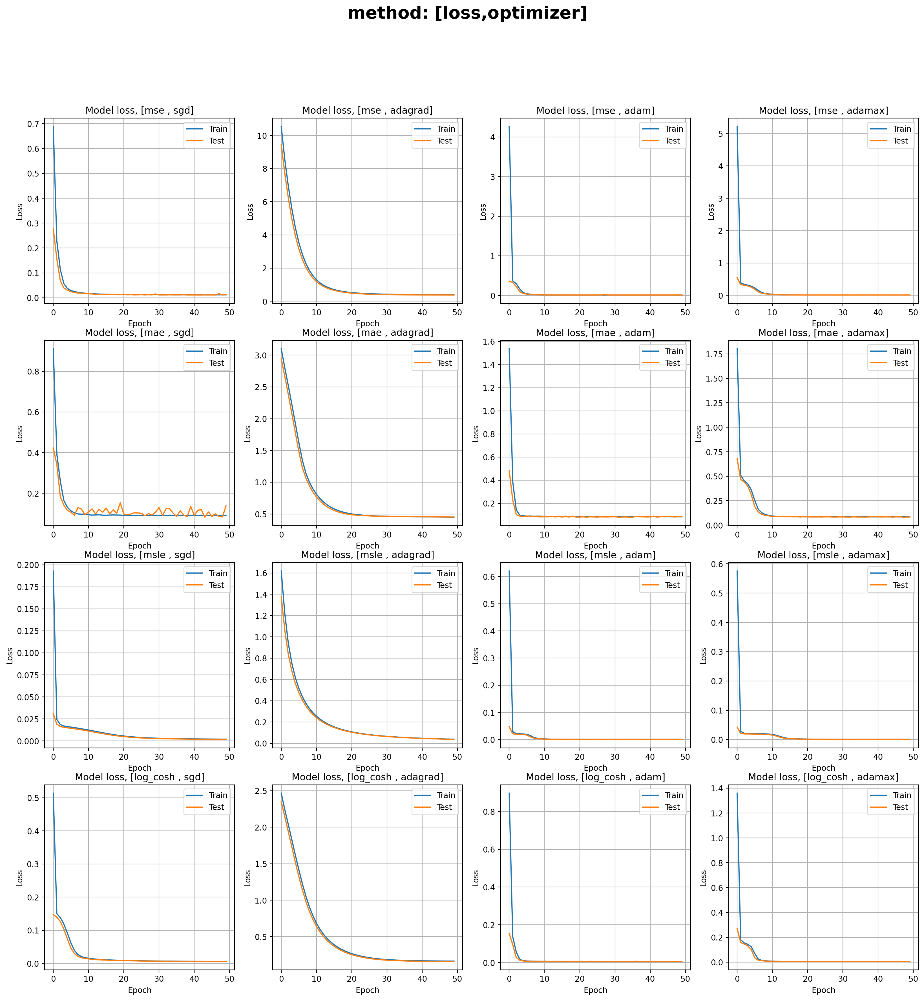

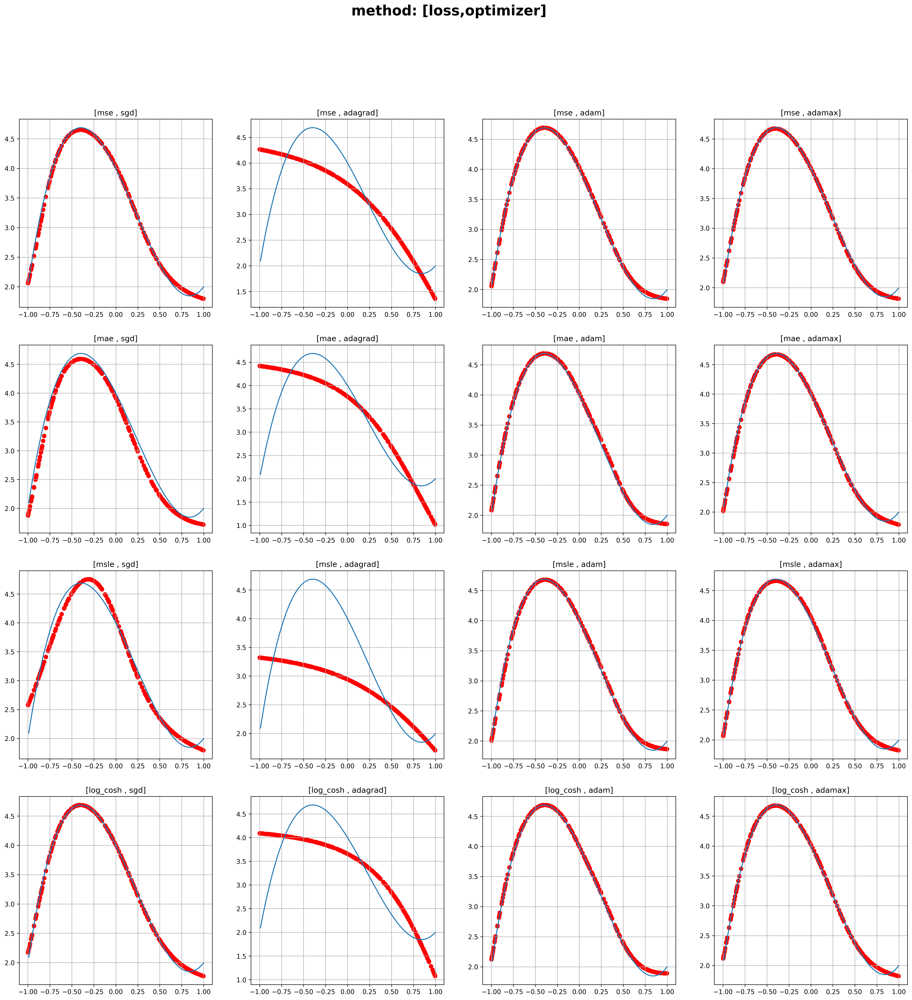

method : [ mse , sgd ] : test loss: 0.003016939153894782
method : [ mse , adagrad ] : test loss: 0.37494906783103943
method : [ mse , adam ] : test loss: 0.0010193041525781155
method : [ mse , adamax ] : test loss: 0.0010610426543280482
method : [ mae , sgd ] : test loss: 0.1316359043121338
method : [ mae , adagrad ] : test loss: 0.4468041956424713
method : [ mae , adam ] : test loss: 0.034643981605768204
method : [ mae , adamax ] : test loss: 0.02646242454648018
method : [ msle , sgd ] : test loss: 0.0011643440229818225
method : [ msle , adagrad ] : test loss: 0.03773129731416702
method : [ msle , adam ] : test loss: 0.0001355352287646383
method : [ msle , adamax ] : test loss: 0.0001268172200070694
method : [ log_cosh , sgd ] : test loss: 0.0009965880308300257
method : [ log_cosh , adagrad ] : test loss: 0.15954339504241943
method : [ log_cosh , adam ] : test loss: 0.0007329246727749705
method : [ log_cosh , adamax ] : test loss: 0.0006330626201815903


In [11]:
Combinations = product(loss,optimizer)
x_predicted = np.random.uniform(-1, 1, 300)
score=[]
fig=plt.figure(figsize=(20,20),dpi=200)
plt.suptitle("method: [loss,optimizer]",weight="bold",size=22)
for index,i in enumerate(Combinations):
    
    plt.subplot(4,4,index+1)
       
    plt.plot(history[index].history['loss'])
    plt.plot(history[index].history['val_loss'])
    plt.title("Model loss, ["+str(i[0])+" , "+str(i[1])+"]")
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='best')
    plt.grid(True)
plt.show() 
Combinations = product(loss,optimizer)
fig=plt.figure(figsize=(25,25),dpi=300)
plt.suptitle("method: [loss,optimizer]",weight="bold",size=22)
for index,i in enumerate(Combinations):  
    score.append(models[index].evaluate(x_valid, y_target, batch_size=32, verbose=0))  
    plt.subplot(4,4,index+1)
    plt.title("["+str(i[0])+" , "+str(i[1])+"]")
    y_predicted = models[index].predict(x_predicted,verbose=0)
    plt.scatter(x_predicted, y_predicted,color='r')
    plt.plot(x_valid, y_target)
    plt.grid(True)
plt.show()
Combinations = product(loss,optimizer)
for index,i in enumerate(Combinations):   
    print("method : [",str(i[0])+" , "+str(i[1]),"] : test loss:",score[index][0])


It seems that using adagard as optimizer, always causes bad predictions.
As in the previous case, there are more combinations that give good results.
The methods with the lowest test loss are: [msle,adam],[msle,adamax].

4/4 [==============================] - 0s 1ms/step


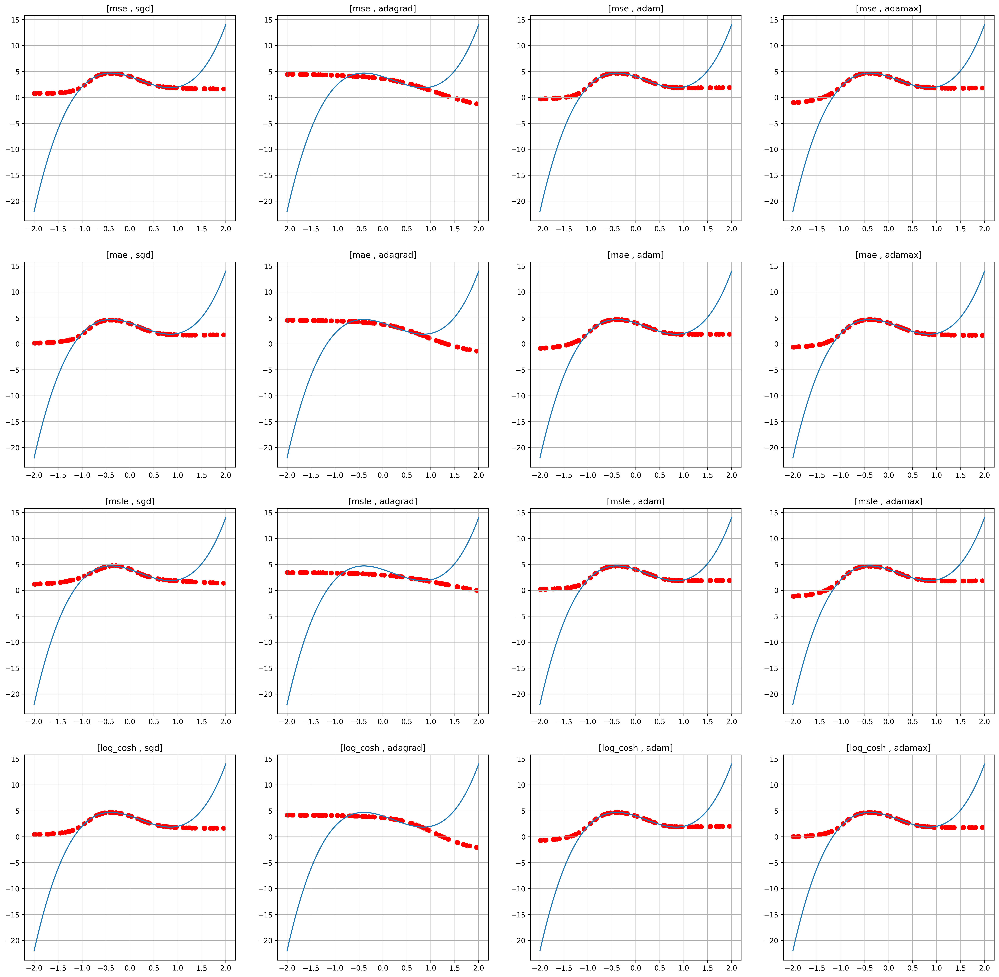

In [12]:
Combinations = product(loss,optimizer)
x_predicted = np.random.uniform(-2, 2, 100)
x_valid2=np.linspace(-2,+2,100)
y_target2=f(x_valid2)
fig=plt.figure(figsize=(25,25),dpi=300)
for index,i in enumerate(Combinations):  
        
    plt.subplot(4,4,index+1)
    plt.title("["+str(i[0])+" , "+str(i[1])+"]")
    y_predicted = models[index].predict(x_predicted)
    plt.scatter(x_predicted, y_predicted,color='r')
    plt.plot(x_valid2, y_target2)
    plt.grid(True)
plt.show()    

If we try to predict $f(x)$ outside the training bounds, we see that none of the methods has been able to correctly model the input function. 

In general, we learned that:
- having too many or too few parameters will cause overfitting or underfitting;
- the right choices of activation functions, loss functions and optimizers depend on the specific problem that we are studying;
- even if there are good predictions in the training bounds, a simple model won't be able to predict outside of them. 


# 11.3
In the following exercise we want to fit:
$$f(x,y)=\sin(x^2+y^2)$$
for $x\in[-\frac{3}{2},\frac{3}{2}]$ and $y\in[-\frac{3}{2},\frac{3}{2}]$.
We used the following parameters:
- $N_{layers}=6$;
- $N_{neurons}=10$ per layer, except for the output layer;
- $N_{train}=100000$;
-  $N_{epochs}=100$;
- Activation functions:$[$elu,tanh,elu,tanh,tanh$]$;
- optimizer: sgd;
- loss function: mse.

In [13]:
from mpl_toolkits.mplot3d import Axes3D
def func(x):
    return np.sin(x[:,0]**2+x[:,1]**2)

In [14]:
N_train=100000
sigma = 0.2
N_epochs=100
N_valid=10000
bound=1.5

In [15]:
x_train=np.zeros((N_train,2))
x_train[:,0] = np.random.uniform(-bound, bound,N_train)
x_train[:,1] = np.random.uniform(-bound, bound,N_train)
y_train = np.random.normal(func(x_train),sigma)

x_valid=np.zeros((N_valid,2))
x_valid[:,0] = np.random.uniform(-bound, bound,N_valid)
x_valid[:,1] =  np.random.uniform(-bound, bound,N_valid)
y_valid = np.random.normal(func(x_valid),sigma)

y_target = func(x_valid)


# morfologia della rete neurale
model = tf.keras.Sequential()
model.add(Dense(10, input_shape=(2,), activation='elu'))
model.add(Dense(10, activation='tanh'))
model.add(Dense(10, activation='elu'))
model.add(Dense(10, activation='tanh'))
model.add(Dense(10, activation='tanh'))
model.add(Dense(1))



model.compile(optimizer='sgd', loss='mse', metrics=['mse'])
model.summary()
history = model.fit(
    x=x_train,
    y=y_train, 
    batch_size=100, 
    epochs=N_epochs,
    shuffle=True,
    validation_data=(x_valid, y_valid))

Model: "sequential_59"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_232 (Dense)           (None, 10)                30        
                                                                 
 dense_233 (Dense)           (None, 10)                110       
                                                                 
 dense_234 (Dense)           (None, 10)                110       
                                                                 
 dense_235 (Dense)           (None, 10)                110       
                                                                 
 dense_236 (Dense)           (None, 10)                110       
                                                                 
 dense_237 (Dense)           (None, 1)                 11        
                                                                 
Total params: 481
Trainable params: 481
Non-trainable

313/313 [==============================] - 0s 655us/step


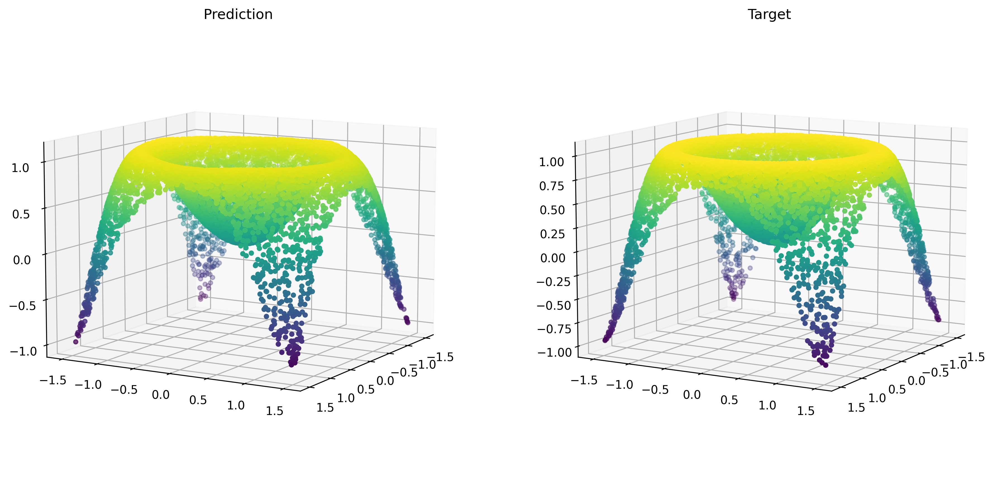

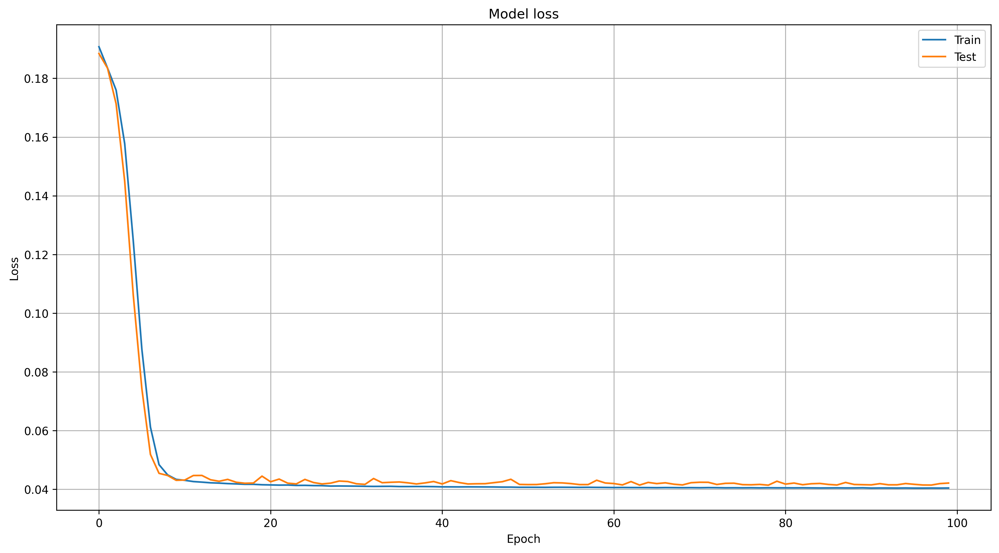

In [16]:
fig = plt.figure(figsize = (15,10),dpi=300)
x_predicted=np.zeros((10000,2))
x_predicted[:,0] = np.random.uniform(-bound, bound,10000)
x_predicted[:,1] = np.random.uniform(-bound, bound,10000)
y_predicted=model.predict(x_predicted)

ax =  fig.add_subplot(1, 2, 1, projection = "3d")
ax.scatter(x_predicted[:,0], x_predicted[:,1], y_predicted, c=y_predicted, marker='.',s=50)
plt.title(" Prediction ")
ax.view_init(10, 30)
ax =  fig.add_subplot(1, 2, 2, projection = "3d")

ax.scatter(x_valid[:,0], x_valid[:,1], y_target, c=y_target, marker='.',s=50)


ax.view_init(10, 30)
plt.title(" Target ")

plt.show()
fig=plt.figure(figsize=(15,8),dpi=300)

       
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title("Model loss")
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='best')
plt.grid(True)
plt.show() 

In the plots above, the model prediction produces good results, even if the model loss doesn't get lower than $\approx 0.04$.

3125/3125 [==============================] - 2s 698us/step


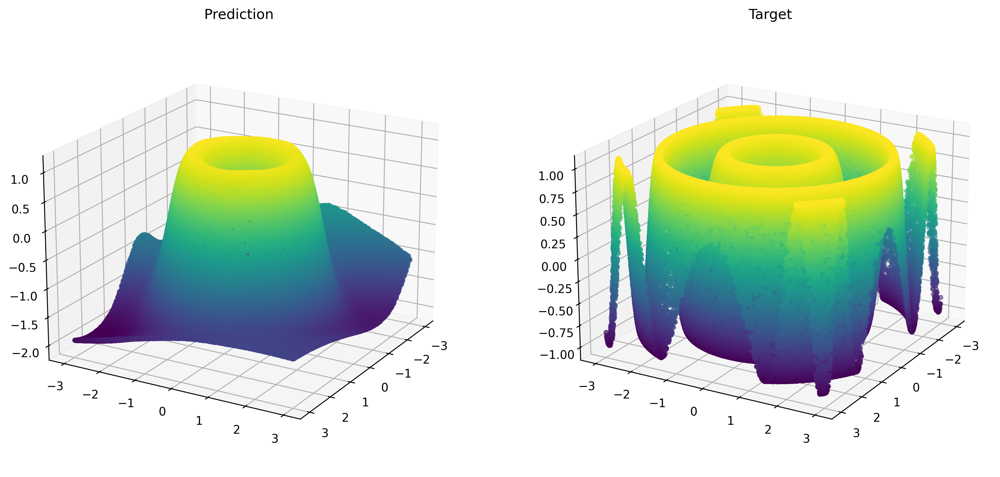

In [17]:
fig = plt.figure(figsize = (15,10),dpi=300)
x_predicted=np.zeros((N_train,2))
x_predicted[:,0] = np.random.uniform(-2*bound, 2*bound,N_train)
x_predicted[:,1] = np.random.uniform(-2*bound, 2*bound,N_train)
y_predicted=model.predict(x_predicted)

x_target2=np.zeros((N_train,2))
x_target2[:,0] = np.random.uniform(-2*bound, 2*bound,N_train)
x_target2[:,1] = np.random.uniform(-2*bound, 2*bound,N_train)
y_target2=func(x_target2)

ax =  fig.add_subplot(1, 2, 1, projection = "3d")
ax.scatter(x_predicted[:,0], x_predicted[:,1], y_predicted, c=y_predicted, marker='.',s=50)
plt.title(" Prediction ")
ax.view_init(20, 30)
ax =  fig.add_subplot(1, 2, 2, projection = "3d")

ax.scatter(x_target2[:,0], x_target2[:,1], y_target2, c=y_target2, marker='.',s=50)


ax.view_init(20, 30)
plt.title(" Target ")

plt.show()

Outside the training bounds, the model is not able to predict the values of $f(x,y)$.